In [ ]:
# Step 1: Upload original datasets
from google.colab import files
uploaded = files.upload()   # Choose Clusters-4-v0.csv, v1.csv, v2.csv

# Step 2: Split into train/test
import pandas as pd
from sklearn.model_selection import train_test_split

files_list = ["clusters-4-v0.csv", "clusters-4-v1.csv", "clusters-4-v2.csv"]

# Split settings
test_size = 0.2       # 20% test, 80% train
random_state = 42     # fixed seed for reproducibility

generated_files = []

for file in files_list:
    # Load dataset
    data = pd.read_csv(file)

    # Split into train and test
    train, test = train_test_split(
        data, test_size=test_size, random_state=random_state, shuffle=True
    )

    # Save new CSVs
    train_file = file.replace(".csv", "_train.csv")
    test_file = file.replace(".csv", "_test.csv")

    train.to_csv(train_file, index=False)
    test.to_csv(test_file, index=False)

    generated_files.extend([train_file, test_file])
    print(f"✅ Saved {train_file} and {test_file}")

# Step 3: Download the new CSVs
print("\nDownloading train/test CSVs...")
for file in generated_files:
    files.download(file)

# Step 4 (Optional): Package into a ZIP for submission
import zipfile

zip_name = "Assignment_Splits.zip"
with zipfile.ZipFile(zip_name, 'w') as zipf:
    for file in generated_files:
        zipf.write(file)

# Download ZIP
files.download(zip_name)
print(f"\n📦 All files packed into {zip_name}")


Saving clusters-4-v0.csv to clusters-4-v0.csv
Saving clusters-4-v2.csv to clusters-4-v2.csv
Saving clusters-4-v1.csv to clusters-4-v1.csv
✅ Saved clusters-4-v0_train.csv and clusters-4-v0_test.csv
✅ Saved clusters-4-v1_train.csv and clusters-4-v1_test.csv
✅ Saved clusters-4-v2_train.csv and clusters-4-v2_test.csv



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


📦 All files packed into Assignment_Splits.zip


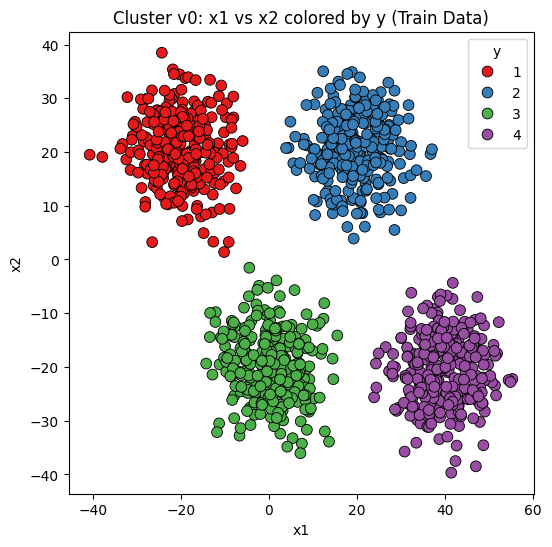

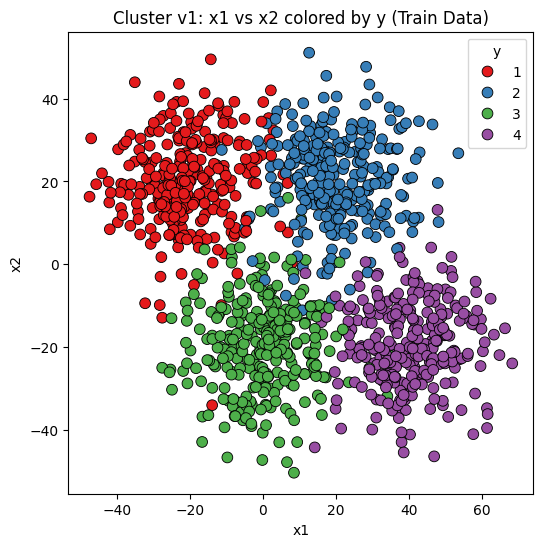

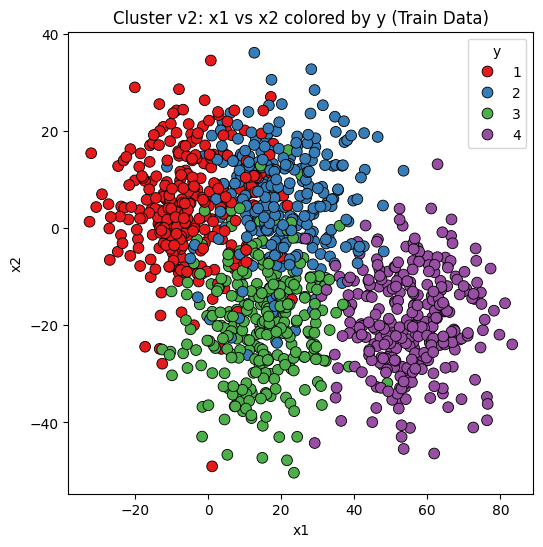

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load train datasets
train_v0 = pd.read_csv("clusters-4-v0_train.csv")
train_v1 = pd.read_csv("clusters-4-v1_train.csv")
train_v2 = pd.read_csv("clusters-4-v2_train.csv")

# Function to plot x1 vs x2 colored by y
def plot_x1_x2_by_y(df, title):
    plt.figure(figsize=(6,6))
    sns.scatterplot(data=df, x="x1", y="x2", hue="y", palette="Set1", s=60, edgecolor="k")
    plt.title(title)
    plt.xlabel("x1")
    plt.ylabel("x2")
    plt.legend(title="y")
    plt.show()

# Plot each dataset
plot_x1_x2_by_y(train_v0, "Cluster v0: x1 vs x2 colored by y (Train Data)")
plot_x1_x2_by_y(train_v1, "Cluster v1: x1 vs x2 colored by y (Train Data)")
plot_x1_x2_by_y(train_v2, "Cluster v2: x1 vs x2 colored by y (Train Data)")


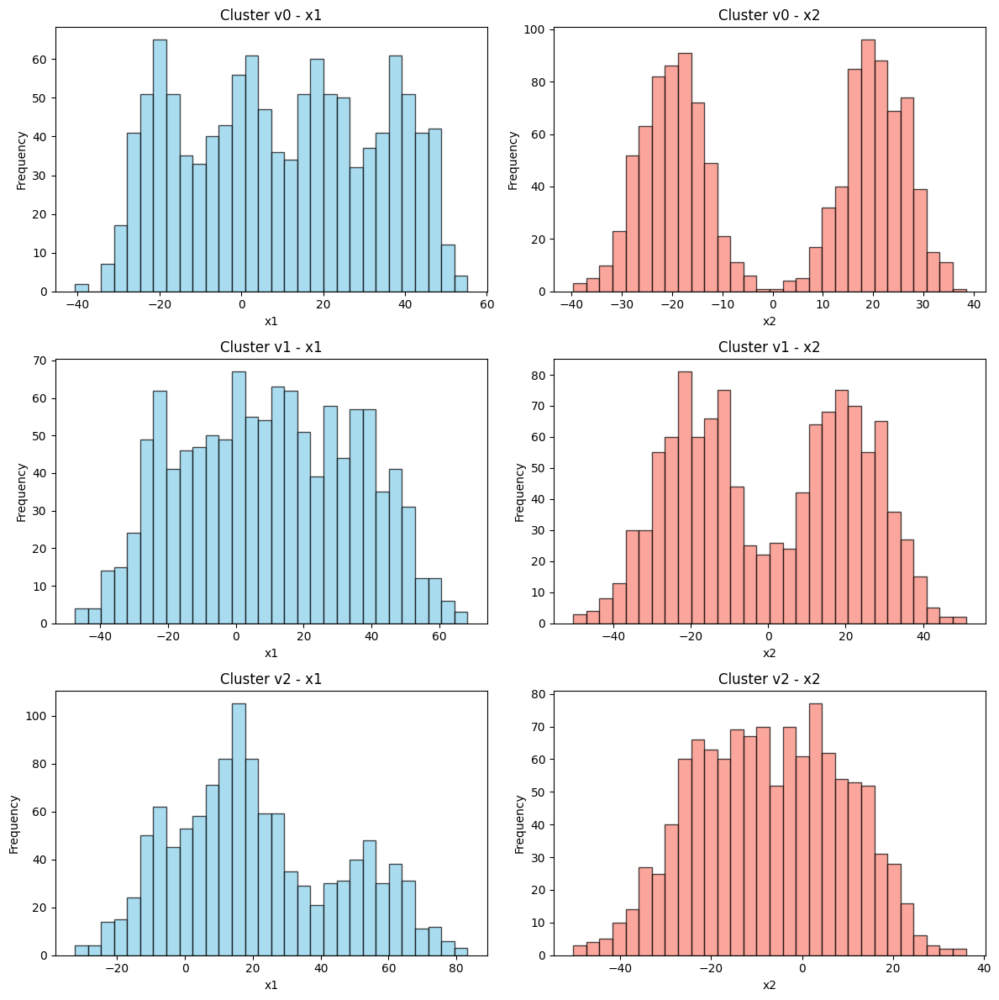

,Dataset,Feature,Mean,Median,Variance,Std,Min,Max
0,Cluster v0,x1,9.845229,9.753953,537.066644,23.174698,-40.704233,55.252202
1,Cluster v0,x2,0.310337,2.304347,454.044429,21.308318,-39.673196,38.471219
2,Cluster v1,x1,9.940631,9.902503,630.847184,25.116671,-47.431286,68.256318
3,Cluster v1,x2,0.302645,0.341221,505.385279,22.480776,-50.352999,51.073358
4,Cluster v2,x1,21.229693,17.242495,597.105206,24.435736,-32.431286,83.256318
5,Cluster v2,x2,-7.210375,-7.340432,264.785959,16.272245,-50.352999,36.073358


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

datasets = [train_v0, train_v1, train_v2]
dataset_names = ["Cluster v0", "Cluster v1", "Cluster v2"]
features = ['x1', 'x2']

# Plot histograms
fig, axes = plt.subplots(len(datasets), len(features), figsize=(12, 12))

for i, df in enumerate(datasets):
    for j, feature in enumerate(features):
        axes[i, j].hist(df[feature], bins=30,
                        color='skyblue' if feature=='x1' else 'salmon',
                        edgecolor='k', alpha=0.7)
        axes[i, j].set_title(f"{dataset_names[i]} - {feature}")
        axes[i, j].set_xlabel(feature)
        axes[i, j].set_ylabel("Frequency")

plt.tight_layout()
plt.show()

# Create statistics table
stats_dict = {'Dataset': [], 'Feature': [], 'Mean': [], 'Median': [], 'Variance': [],
              'Std': [], 'Min': [], 'Max': []}

for i, df in enumerate(datasets):
    for feature in features:
        stats_dict['Dataset'].append(dataset_names[i])
        stats_dict['Feature'].append(feature)
        stats_dict['Mean'].append(df[feature].mean())
        stats_dict['Median'].append(df[feature].median())
        stats_dict['Variance'].append(df[feature].var())
        stats_dict['Std'].append(df[feature].std())
        stats_dict['Min'].append(df[feature].min())
        stats_dict['Max'].append(df[feature].max())

stats_df = pd.DataFrame(stats_dict)
stats_df


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


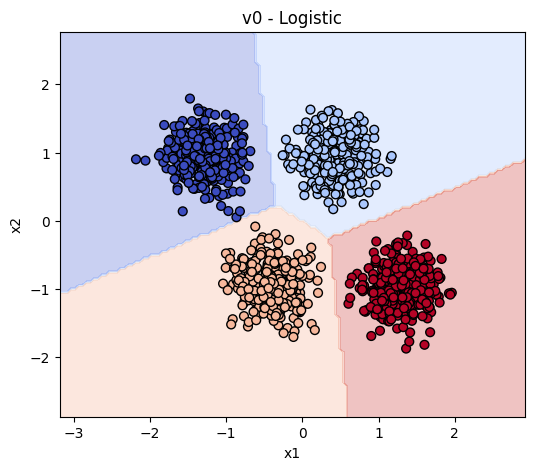

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


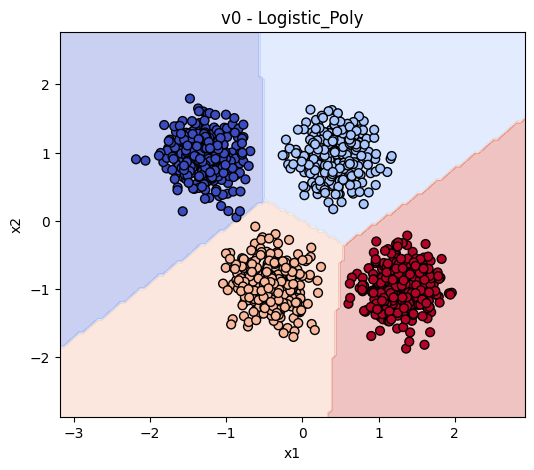

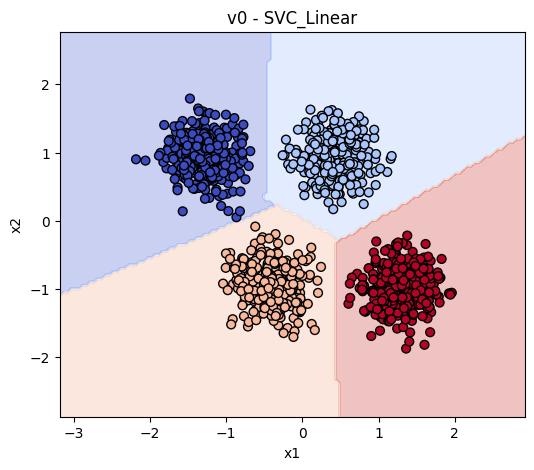

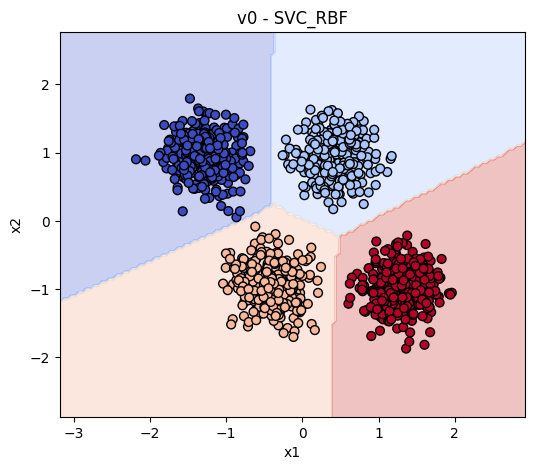

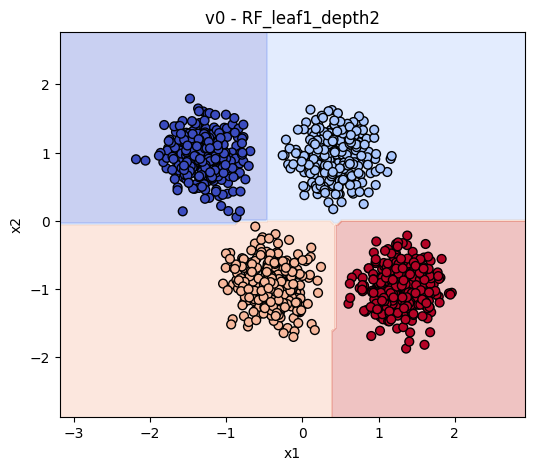

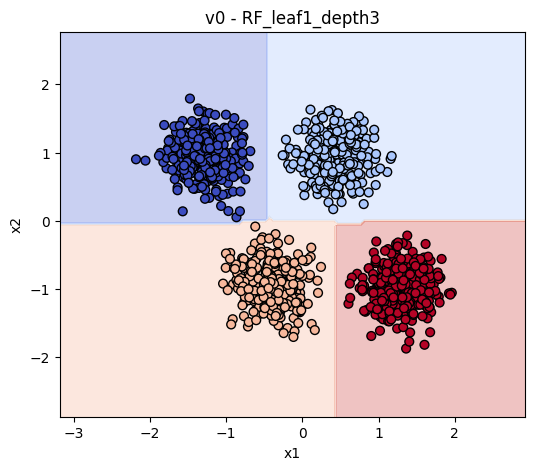

...

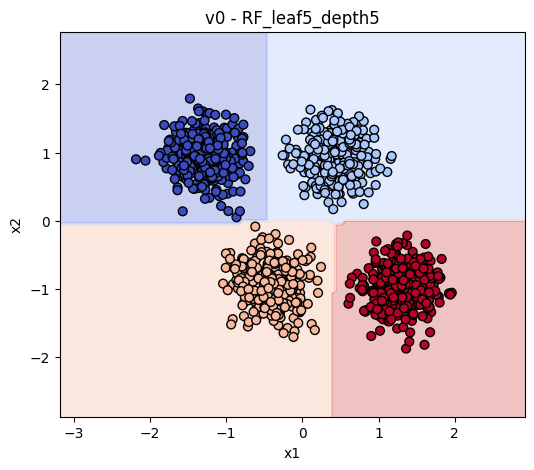

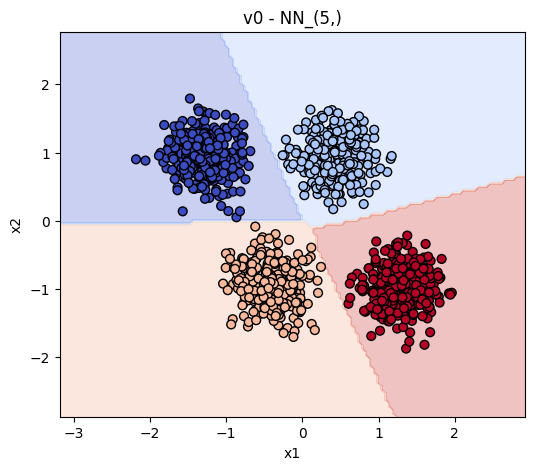

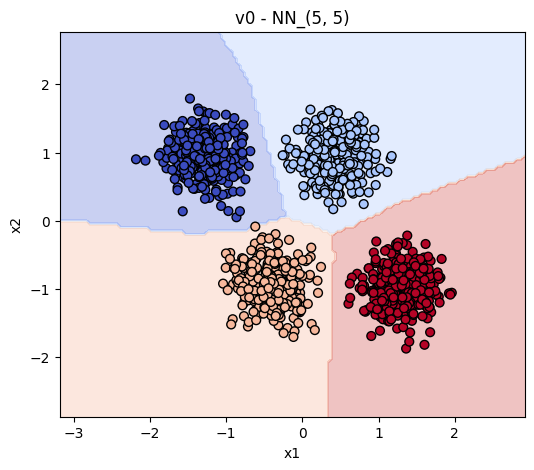

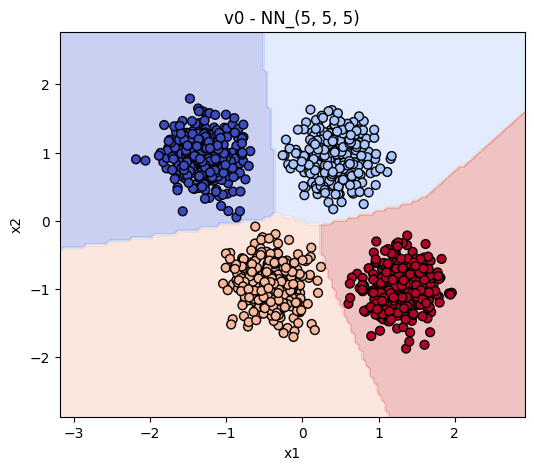

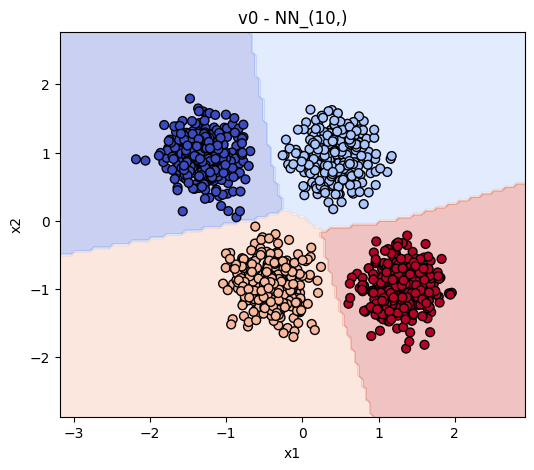

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


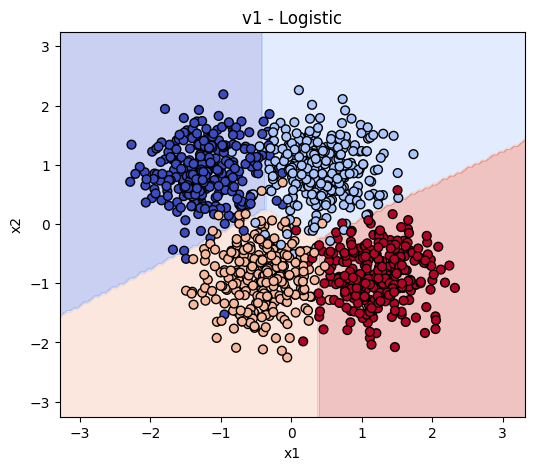

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


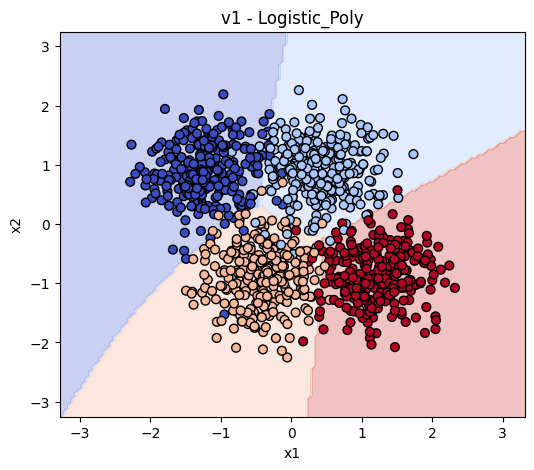

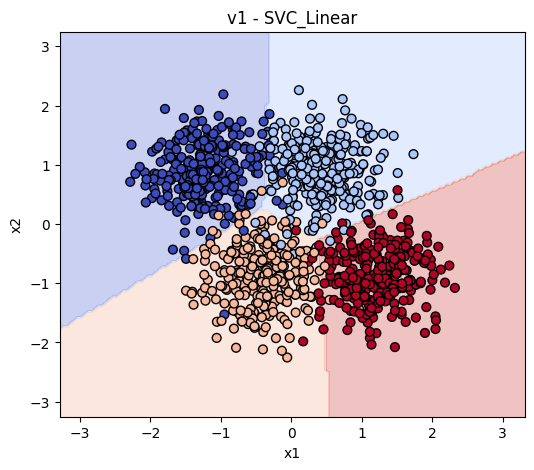

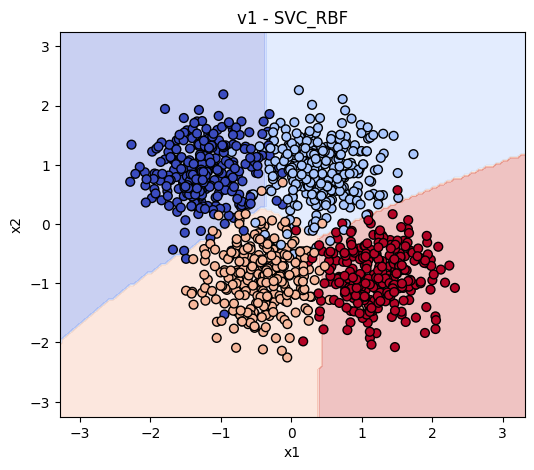

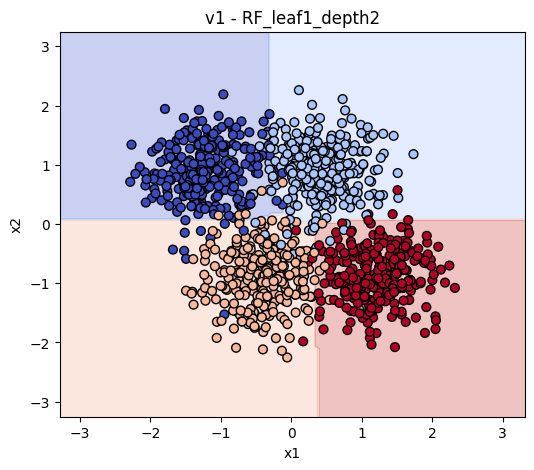

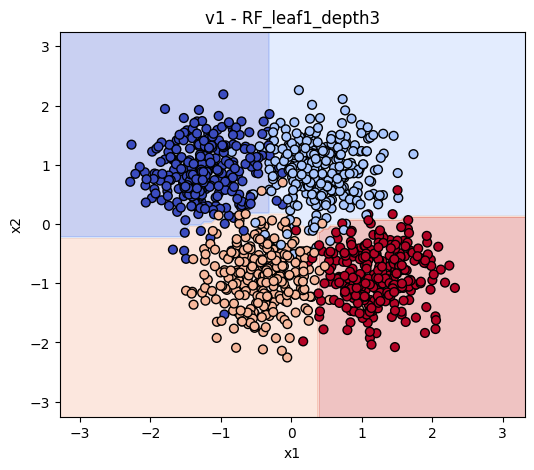

...

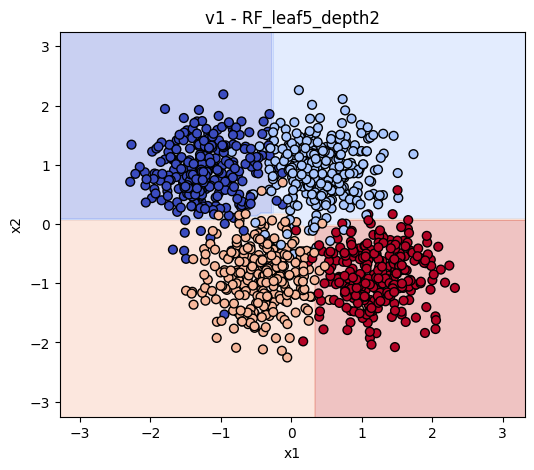

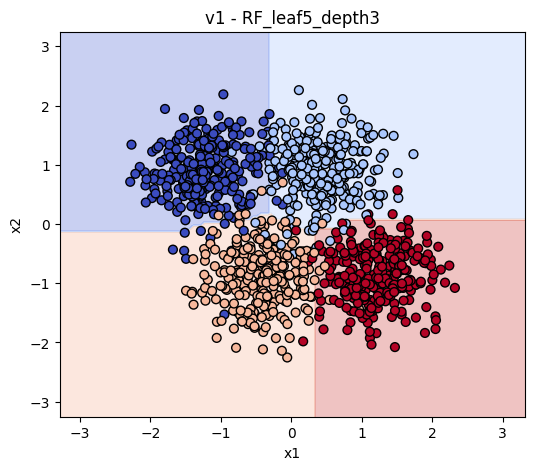

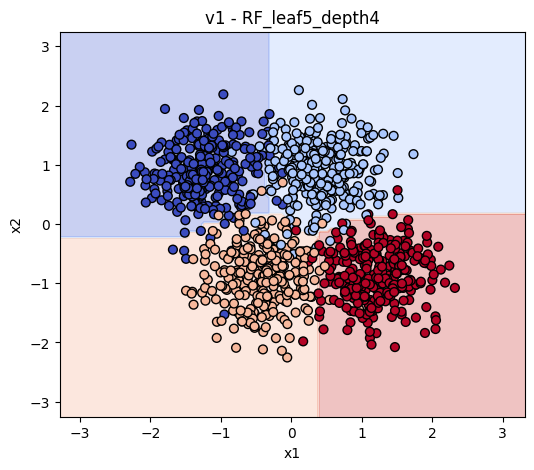

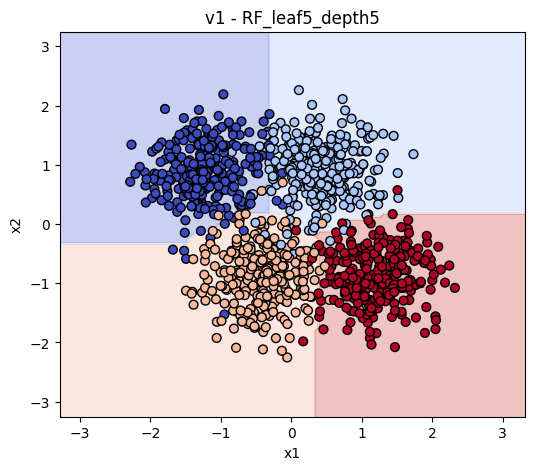

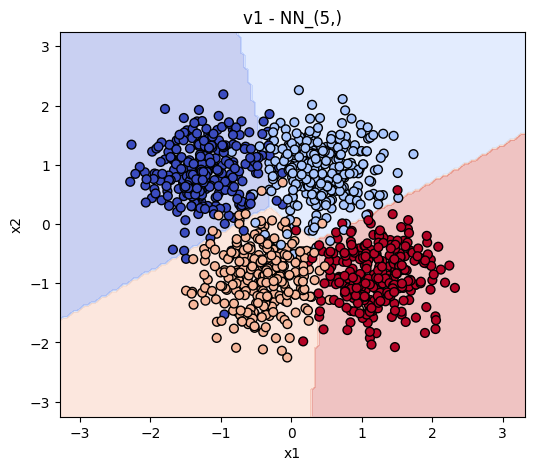

/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


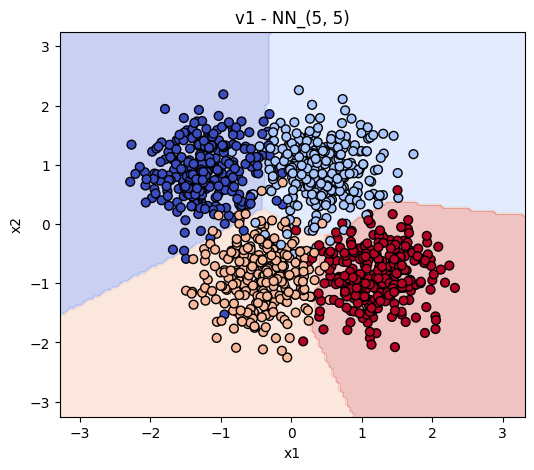

/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


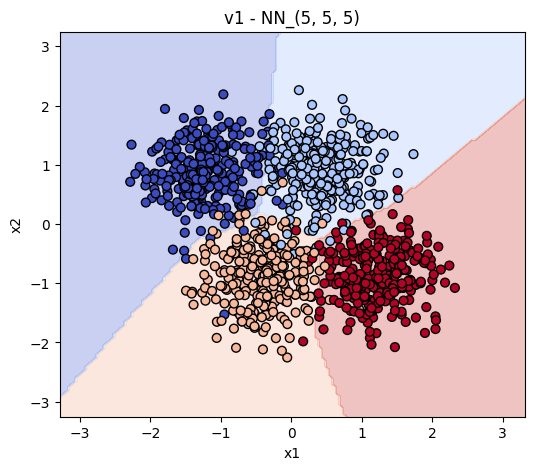

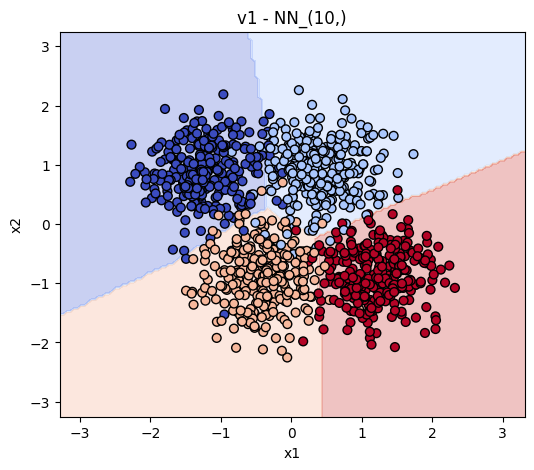

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


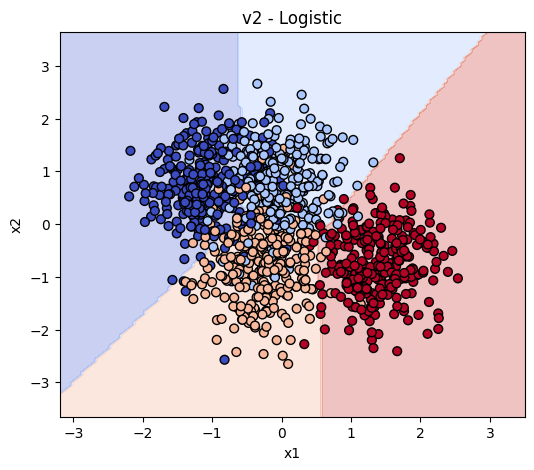

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


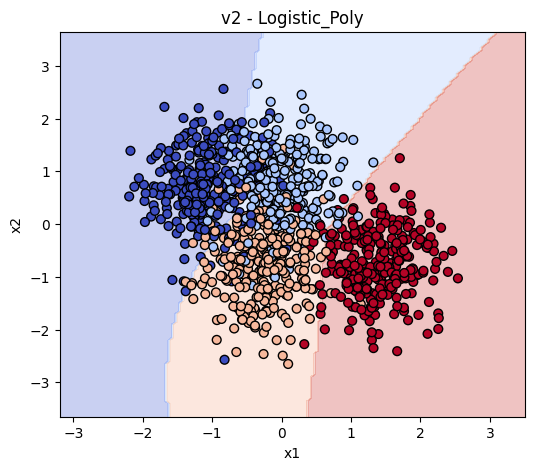

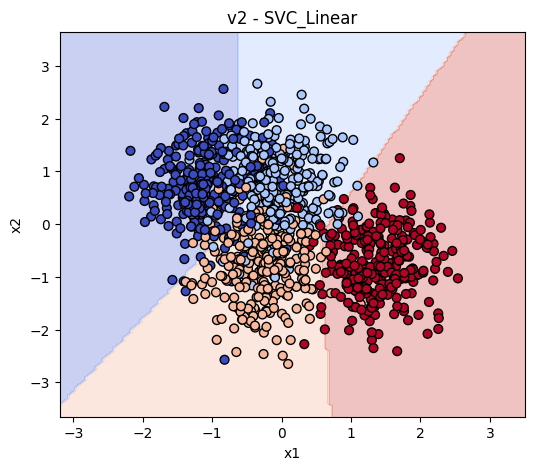

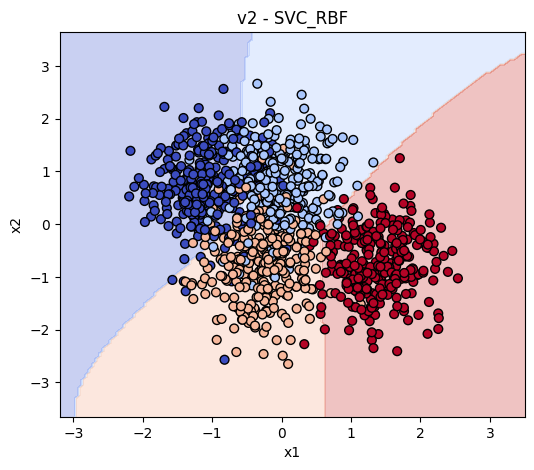

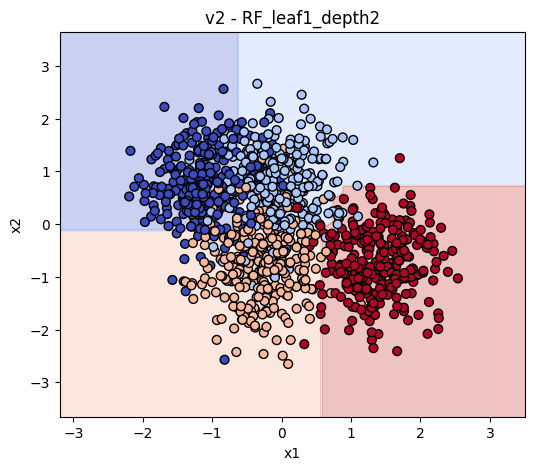

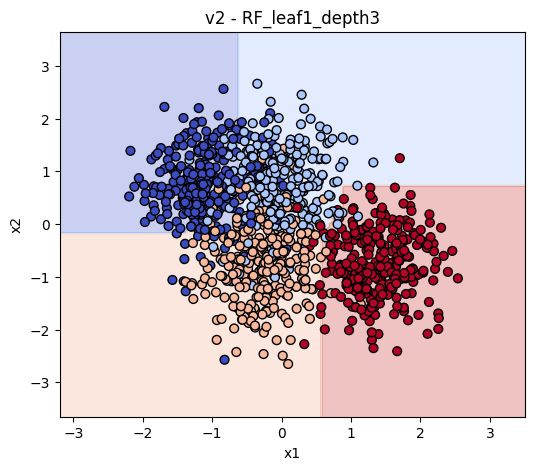

...

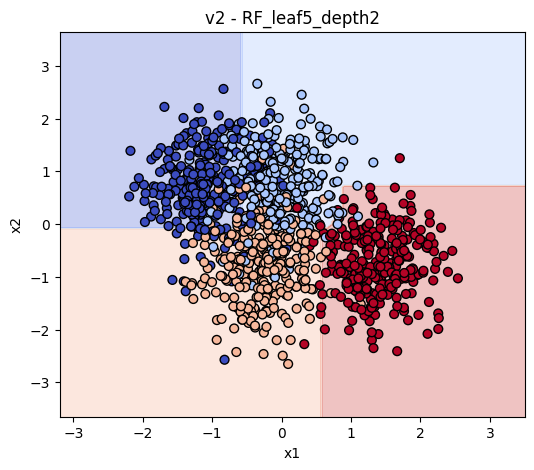

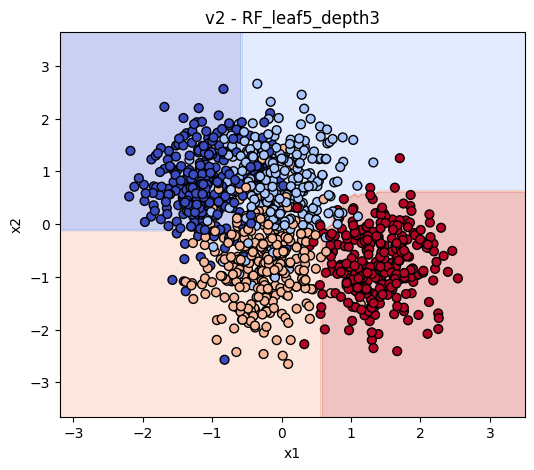

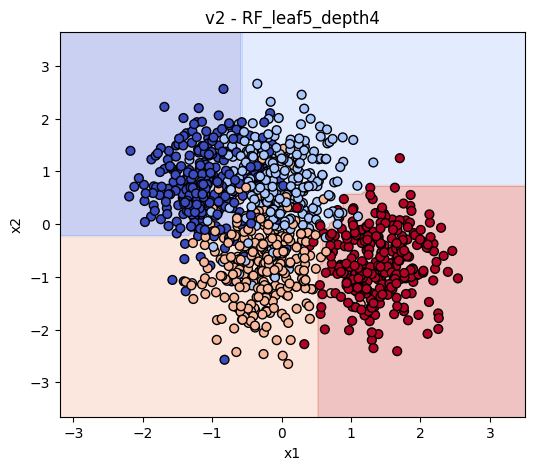

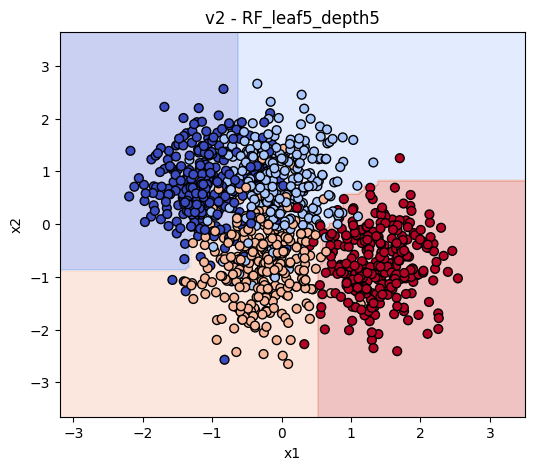

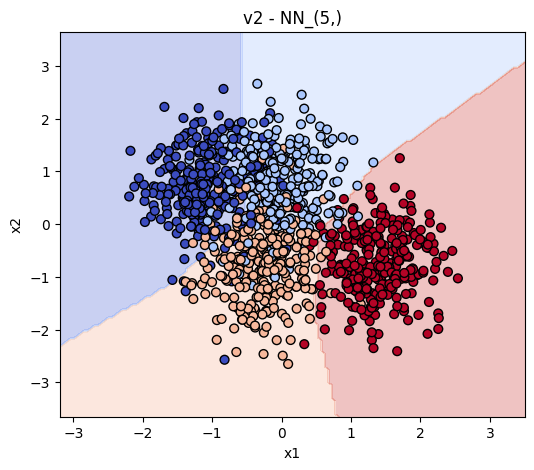

/usr/local/lib/python3.12/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


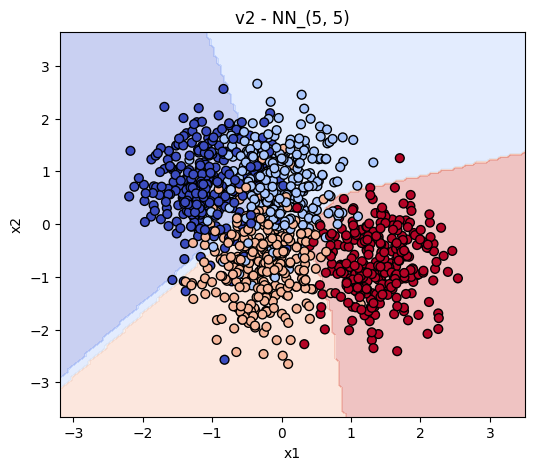

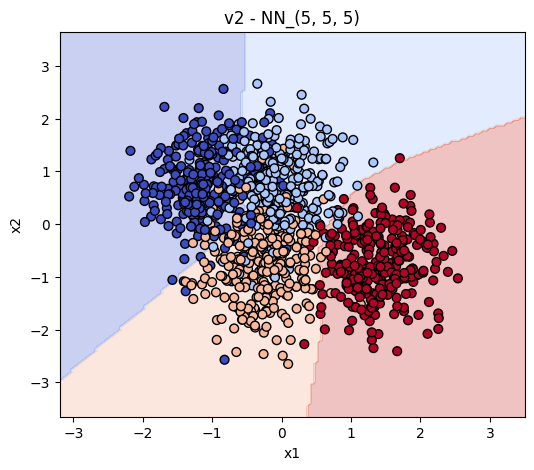

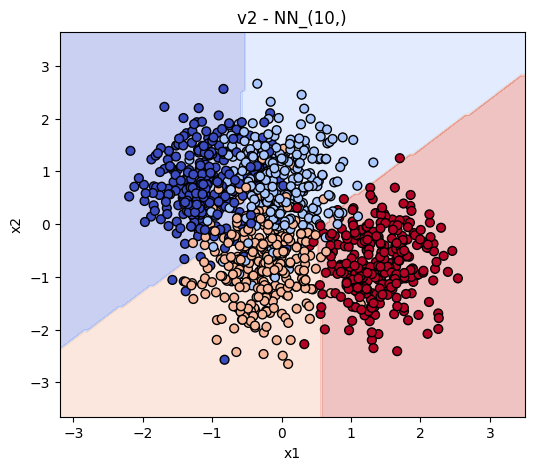

✅ Metrics saved to all_datasets_results.csv
✅ Decision boundary plots displayed inline


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelBinarizer, PolynomialFeatures
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# =========================
# Load train/test datasets
# =========================
train_v0 = pd.read_csv("clusters-4-v0_train.csv")
test_v0  = pd.read_csv("clusters-4-v0_test.csv")
train_v1 = pd.read_csv("clusters-4-v1_train.csv")
test_v1  = pd.read_csv("clusters-4-v1_test.csv")
train_v2 = pd.read_csv("clusters-4-v2_train.csv")
test_v2  = pd.read_csv("clusters-4-v2_test.csv")

datasets = {
    'v0': {'train': train_v0, 'test': test_v0},
    'v1': {'train': train_v1, 'test': test_v1},
    'v2': {'train': train_v2, 'test': test_v2},
}


def plot_roc_curve(y_true, y_proba, classes, title):
    y_bin = label_binarize(y_true, classes=classes)
    plt.figure(figsize=(6,5))

    for i, cls in enumerate(classes):
        fpr, tpr, _ = roc_curve(y_bin[:,i], y_proba[:,i])
        roc_auc = auc(fpr[~np.isnan(fpr)], tpr[~np.isnan(tpr)]) # Handle potential NaN in fpr/tpr
        plt.plot(fpr, tpr, label=f"Class {cls} (AUC = {roc_auc:.2f})")

    plt.plot([0,1], [0,1], 'k--')
    plt.xlim([0.0,1.0])
    plt.ylim([0.0,1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(title)
    plt.legend(loc="lower right")
    plt.show()

# =========================
# Function to plot decision boundaries
# =========================
def plot_decision_boundary(clf, X, y, title, poly=None):
    x_min, x_max = X[:,0].min() - 1, X[:,0].max() + 1
    y_min, y_max = X[:,1].min() - 1, X[:,1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.05),
                         np.arange(y_min, y_max, 0.05))
    grid = np.c_[xx.ravel(), yy.ravel()]
    if poly:
        grid = poly.transform(grid)
    Z = clf.predict(grid)
    Z = Z.reshape(xx.shape)

    plt.figure(figsize=(6,5))
    plt.contourf(xx, yy, Z, alpha=0.3, cmap=plt.cm.coolwarm)
    plt.scatter(X[:,0], X[:,1], c=y, cmap=plt.cm.coolwarm, edgecolor='k', s=40)
    plt.title(title)
    plt.xlabel("x1")
    plt.ylabel("x2")
    plt.show()

# =========================
# Metrics storage
# =========================
results_list = []

# =========================
# Loop over datasets
# =========================
for ds_name, data_dict in datasets.items():
    X_train = data_dict['train'][['x1','x2']].values
    y_train = data_dict['train']['y'].values
    X_test = data_dict['test'][['x1','x2']].values
    y_test = data_dict['test']['y'].values

    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # =========================
    # Prepare classifiers
    # =========================
    classifiers = []

    classifiers.append(('Logistic', LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=500)))

    poly = PolynomialFeatures(degree=2)
    X_train_poly = poly.fit_transform(X_train)
    X_test_poly = poly.transform(X_test)
    classifiers.append(('Logistic_Poly', LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=500)))

    classifiers.append(('SVC_Linear', SVC(kernel='linear', probability=True)))
    classifiers.append(('SVC_RBF', SVC(kernel='rbf', probability=True, C=10))) # Increased C for SVC RBF

    rf_params = [(leaf, depth) for leaf in range(1,6) for depth in range(2,6)]
    for leaf, depth in rf_params:
        classifiers.append((f'RF_leaf{leaf}_depth{depth}', RandomForestClassifier(min_samples_leaf=leaf, max_depth=depth, n_estimators=100)))

    nn_architectures = [(5,), (5,5), (5,5,5), (10,)]
    for arch in nn_architectures:
        classifiers.append((f'NN_{arch}', MLPClassifier(hidden_layer_sizes=arch, max_iter=500)))

    # =========================
    # Loop over classifiers
    # =========================
    for clf_name, clf in classifiers:
        if clf_name == 'Logistic_Poly':
            clf.fit(X_train_poly, y_train)
            y_pred_train = clf.predict(X_train_poly)
            y_pred_test = clf.predict(X_test_poly)
            y_proba_train = clf.predict_proba(X_train_poly)
            y_proba_test = clf.predict_proba(X_test_poly)
            poly_transform = poly
            X_plot = X_train
        else:
            clf.fit(X_train, y_train)
            y_pred_train = clf.predict(X_train)
            y_pred_test = clf.predict(X_test)
            poly_transform = None
            X_plot = X_train

            if hasattr(clf, "predict_proba"):
                y_proba_train = clf.predict_proba(X_train)
                y_proba_test = clf.predict_proba(X_test)
            else:
                lb = LabelBinarizer()
                lb.fit(y_train)
                y_proba_train = lb.transform(y_pred_train)
                y_proba_test = lb.transform(y_pred_test)

        # =========================
        # Metrics calculation
        # =========================
        precision_train = precision_score(y_train, y_pred_train, average=None, zero_division=0)
        recall_train = recall_score(y_train, y_pred_train, average=None, zero_division=0)
        f1_train = f1_score(y_train, y_pred_train, average=None, zero_division=0)
        precision_train_avg = precision_score(y_train, y_pred_train, average='macro', zero_division=0)
        recall_train_avg = recall_score(y_train, y_pred_train, average='macro', zero_division=0)
        f1_train_avg = f1_score(y_train, y_pred_train, average='macro', zero_division=0)
        accuracy_train = accuracy_score(y_train, y_pred_train)
        auc_train = roc_auc_score(LabelBinarizer().fit_transform(y_train), y_proba_train, average=None, multi_class='ovr')
        auc_train_avg = roc_auc_score(LabelBinarizer().fit_transform(y_train), y_proba_train, average='macro', multi_class='ovr')

        precision_test = precision_score(y_test, y_pred_test, average=None, zero_division=0)
        recall_test = recall_score(y_test, y_pred_test, average=None, zero_division=0)
        f1_test = f1_score(y_test, y_pred_test, average=None, zero_division=0)
        precision_test_avg = precision_score(y_test, y_pred_test, average='macro', zero_division=0)
        recall_test_avg = recall_score(y_test, y_pred_test, average='macro', zero_division=0)
        f1_test_avg = f1_score(y_test, y_pred_test, average='macro', zero_division=0)
        accuracy_test = accuracy_score(y_test, y_pred_test)
        auc_test = roc_auc_score(LabelBinarizer().fit_transform(y_test), y_proba_test, average=None, multi_class='ovr')
        auc_test_avg = roc_auc_score(LabelBinarizer().fit_transform(y_test), y_proba_test, average='macro', multi_class='ovr')

        classes = np.unique(y_train)

        # # Plot ROC curves for train and test - Removed as requested
        # plot_roc_curve(y_train, y_proba_train, classes, f"{ds_name} - {clf_name} - Train ROC")
        # plot_roc_curve(y_test, y_proba_test, classes, f"{ds_name} - {clf_name} - Test ROC")


        # =========================
        # Save metrics
        # =========================
        results_list.append({
            'Dataset': ds_name,
            'Model': clf_name,
            'Accuracy_Train': accuracy_train,
            'Accuracy_Test': accuracy_test,
            'Precision_Train': precision_train,
            'Precision_Test': precision_test,
            'Precision_Train_avg': precision_train_avg,
            'Precision_Test_avg': precision_test_avg,
            'Recall_Train': recall_train,
            'Recall_Test': recall_test,
            'Recall_Train_avg': recall_train_avg,
            'Recall_Test_avg': recall_test_avg,
            'F1_Train': f1_train,
            'F1_Test': f1_test,
            'F1_Train_avg': f1_train_avg,
            'F1_Test_avg': f1_test_avg,
            'AUC_Train': auc_train,
            'AUC_Test': auc_test,
            'AUC_Train_avg': auc_train_avg,
            'AUC_Test_avg': auc_test_avg
        })

        # =========================
        # Show decision boundary plot
        # =========================
        plot_decision_boundary(clf, X_plot, y_train, f"{ds_name} - {clf_name}", poly=poly_transform)

# =========================
# Save all metrics to CSV
# =========================
results_df = pd.DataFrame(results_list)
results_df.to_csv("all_datasets_results.csv", index=False)
print("✅ Metrics saved to all_datasets_results.csv")
print("✅ Decision boundary plots displayed inline")